In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
sns.set_theme(style="darkgrid")

In [10]:
df_routes = pd.read_csv('user_routes_2019_2020.csv')
df_routes['year'] = pd.DatetimeIndex(df_routes['hmonth']).year
df_routes['month'] = pd.DatetimeIndex(df_routes['hmonth']).month
df_routes.head()

,user_id,start_area_id,finish_area_id,start_time,finish_time,hmonth,year,month
0,36453,492,417,2020-08-11 15:00:00,2020-08-11 16:00:00,2020-08-01,2020,8
1,42921,492,417,2020-09-01 22:00:00,2020-09-01 23:00:00,2020-09-01,2020,9
2,17307,526,435,2020-06-07 10:00:00,2020-06-07 13:00:00,2020-06-01,2020,6
3,24129,416,49,2019-04-21 19:00:00,2019-04-21 20:00:00,2019-04-01,2019,4
4,10139,540,539,2020-05-01 06:00:00,2020-05-01 07:00:00,2020-05-01,2020,5


In [11]:
df_districts = pd.read_csv('districts_info.csv', sep='|')
df_districts.head()

,area_id,region_name,area_name,centroid_lat,centroid_lon,neighbor_area_idx
0,504,Ivano-Frankivska,Nadvirnianskyi raion,48.629834,24.577387,"""[\""529\"", \""473\"", \""505\"", \""437\"", \""506\"",..."
1,505,Ivano-Frankivska,Bohorodchanskyi raion,48.807555,24.543633,"""[\""473\"", \""504\"", \""503\"", \""509\"", \""531\""]"""
2,506,Ivano-Frankivska,Yaremchanska mis'ka rada,48.455939,24.569405,"""[\""471\"", \""504\"", \""437\"", \""510\""]"""
3,507,Ivano-Frankivska,Ivano-Frankivska mis'ka rada,48.917401,24.710827,"""[\""473\""]"""
4,508,Zaporizka,Zaporizka mis'ka rada,47.845421,35.160531,"""[\""459\"", \""461\""]"""


In [12]:
df_routes_with_districts = df_routes.merge(df_districts, how='left', left_on='finish_area_id', right_on='area_id')
df_routes_with_districts = df_routes_with_districts[['user_id', 'finish_area_id', 'region_name', 'year', 'finish_time']]
df_routes_with_districts.head()

,user_id,finish_area_id,region_name,year,finish_time
0,36453,417,Kyivska,2020,2020-08-11 16:00:00
1,42921,417,Kyivska,2020,2020-09-01 23:00:00
2,17307,435,Zakarpatska,2020,2020-06-07 13:00:00
3,24129,49,Zhytomyrska,2019,2019-04-21 20:00:00
4,10139,539,Zaporizka,2020,2020-05-01 07:00:00


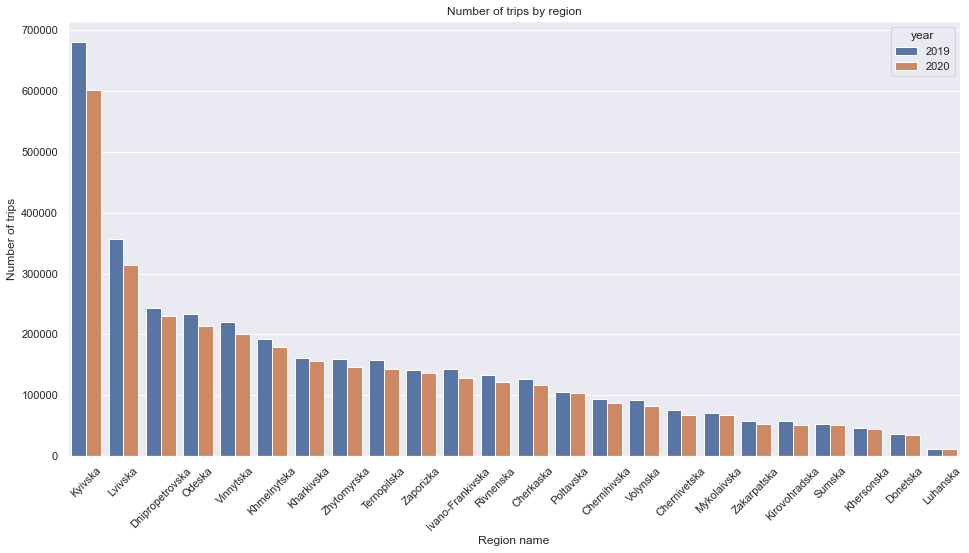

In [13]:
plt.figure(figsize=(16, 8))
order = df_routes_with_districts['region_name'].value_counts().index
ax = sns.countplot(x="region_name", hue='year', data=df_routes_with_districts, order=order)
plt.xticks(rotation=45);
ax.set(xlabel='Region name', ylabel='Number of trips');
plt.title('Number of trips by region');

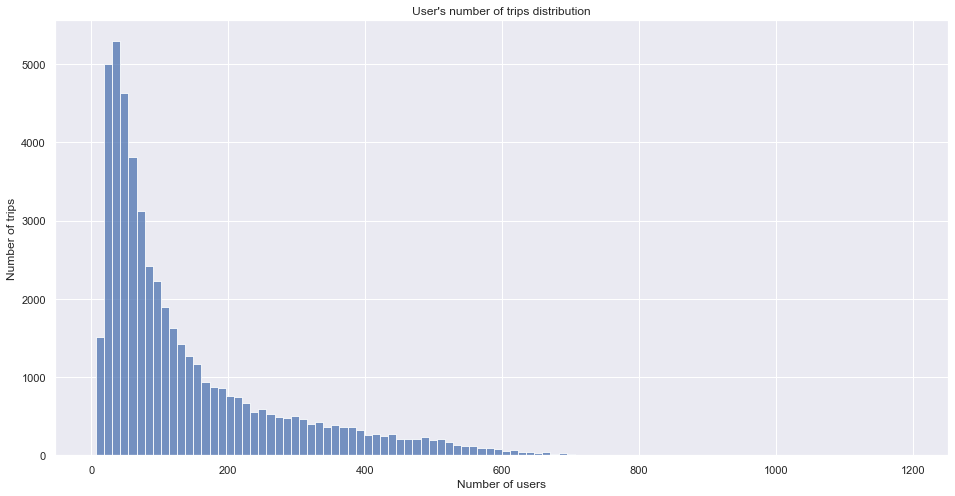

In [14]:
plt.figure(figsize=(16, 8))
user_counts = df_routes.groupby('user_id').size().reset_index()
user_counts.columns = ['user_id', 'count']
ax = sns.histplot(x=user_counts['count'], data=user_counts, bins=100)
ax.set(xlabel='Number of users', ylabel='Number of trips');
plt.title("User's number of trips distribution");

Text(0.5, 1.0, 'Total number of trips by month')

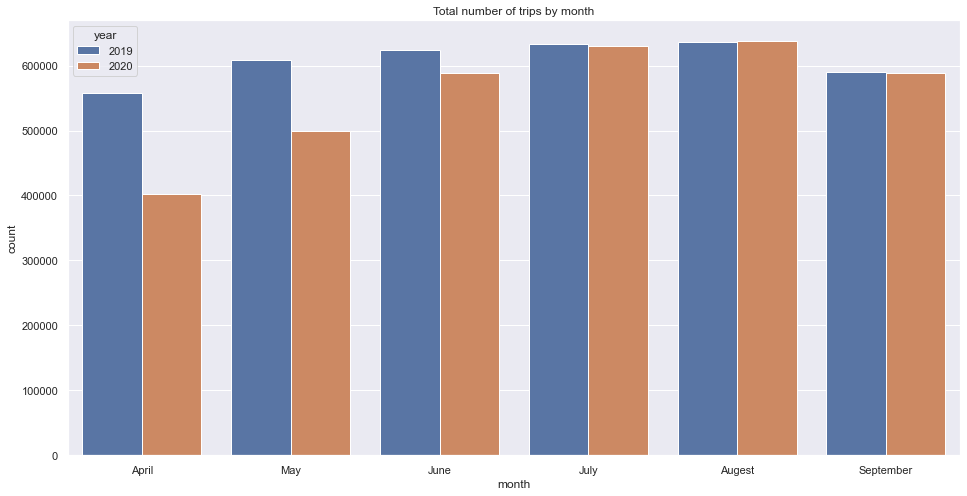

In [15]:
plt.figure(figsize=(16, 8))
year_counts = df_routes.groupby(['year', 'month']).size().reset_index()
year_counts.columns = ['year', 'month', 'count']
ax = sns.barplot(x="month", y='count', hue='year', data=year_counts)
ax.set_xticklabels(['April','May','June','July','Augest','September']);

plt.title('Total number of trips by month')


In [47]:
plt.figure(figsize=(16, 8), dpi=80)

num_of_trips_by_day = df_routes.copy()
num_of_trips_by_day['day_of_month'] = pd.DatetimeIndex(num_of_trips_by_day['finish_time']).dayofweek
num_of_trips_by_day['is_workday'] = num_of_trips_by_day['day_of_month'].isin([0, 1, 2, 3, 4])

num_of_trips_by_day = num_of_trips_by_day.groupby(['user_id', 'is_workday']).size().reset_index()
num_of_trips_by_day = num_of_trips_by_day.pivot_table(values=0, index='user_id', columns='is_workday')
num_of_trips_by_day.columns = ['False', 'True']

fig = px.scatter(num_of_trips_by_day, x='True', y='False', opacity=0.1)
fig.show();

<Figure size 1280x640 with 0 Axes>

In [30]:
from sklearn.preprocessing import LabelEncoder

df_routes_with_districts['region_id'] = LabelEncoder().fit_transform(df_routes_with_districts['region_name'].astype(str))
df_routes_with_districts['region_id'] = LabelEncoder().fit_transform(df_routes_with_districts['region_name'].astype(str))
df_routes_with_districts.head()

,user_id,finish_area_id,region_name,year,finish_time,region_id
0,36453,417,Kyivska,2020,2020-08-11 16:00:00,10
1,42921,417,Kyivska,2020,2020-09-01 23:00:00,10
2,17307,435,Zakarpatska,2020,2020-06-07 13:00:00,21
3,24129,49,Zhytomyrska,2019,2019-04-21 20:00:00,23
4,10139,539,Zaporizka,2020,2020-05-01 07:00:00,22


In [31]:
import folium
import pandas as pd

#create a map
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.centroid_lat, point.centroid_lon],
                        radius=2,
                        weight=5).add_to(this_map)

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_districts.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
this_map.save('simple_dot_plot.html')

In [32]:
this_map

In [33]:
region_id_counts = df_routes_with_districts.groupby(['user_id', 'region_id']).size()
region_id_counts.head()

user_id  region_id
1        5            261
         12             3
2        12             1
         14           300
         16             1
dtype: int64

In [34]:
df_pivot = region_id_counts.reset_index().pivot_table(values=0, index='user_id', columns='region_id').fillna(0).astype(int)
df_pivot.head()

region_id,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
user_id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,261,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,4,2,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,64,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [35]:
df_pivot_witout_max = df_pivot.iloc[:].apply(lambda x: x.replace(x.max(), 0), axis=1)
# df_pivot_witout_max = df_pivot

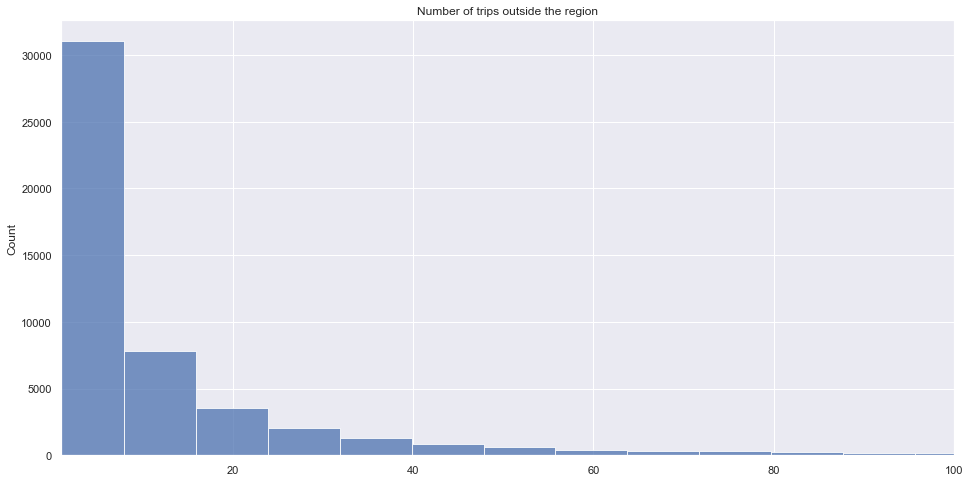

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")

plt.figure(figsize=(16, 8))
ax = sns.histplot(df_pivot_witout_max.sum(axis=1), bins=100);
ax.set_xlim(1, 100)
plt.title('Number of trips outside the region');

In [38]:
trips = pd.concat([df_pivot_witout_max.sum(axis=1), df_routes.groupby('user_id').size() - df_pivot_witout_max.sum(axis=1)], axis=1)
trips.columns = ['outside', 'inside']
trips

# plt.figure(figsize=(12, 6))
# sns.scatterplot(data=trips, x='inside', y='outside', alpha=0.1);

fig = px.scatter(trips, x='inside', y='outside', opacity=0.1)
fig.show();

In [39]:
trips_to_other_regions = df_pivot_witout_max.sum(axis=1)
indexes = trips_to_other_regions[trips_to_other_regions == 0].index
indexes

Int64Index([    5,     8,    10,    24,    25,    27,    28,    32,    34,
               37,
            ...
            49956, 49962, 49965, 49966, 49975, 49982, 49991, 49992, 49993,
            49999],
           dtype='int64', name='user_id', length=12240)

In [ ]:
home_users = df_routes[df_routes.user_id.isin(indexes)]
road_users = df_routes[~df_routes.user_id.isin(indexes)]
home_users.head()

In [ ]:
print(len(home_users))
print(len(road_users))
print(len(home_users) + len(road_users))

In [60]:
plt.figure(figsize=(16, 8))

num_of_trips_by_day = home_users.copy()
num_of_trips_by_day['day_of_month'] = pd.DatetimeIndex(num_of_trips_by_day['finish_time']).dayofweek
num_of_trips_by_day['is_workday'] = num_of_trips_by_day['day_of_month'].isin([0, 1, 2, 3, 4])

num_of_trips_by_day = num_of_trips_by_day.groupby(['user_id', 'is_workday']).size().reset_index()
num_of_trips_by_day = num_of_trips_by_day.pivot_table(values=0, index='user_id', columns='is_workday')
num_of_trips_by_day.columns = ['False', 'True']

fig = px.scatter(num_of_trips_by_day, x='False', y='True', opacity=0.1, color_discrete_sequence=['red'], title='Is workday?')

num_of_trips_by_day = road_users.copy()
num_of_trips_by_day['day_of_month'] = pd.DatetimeIndex(num_of_trips_by_day['finish_time']).dayofweek
num_of_trips_by_day['is_workday'] = num_of_trips_by_day['day_of_month'].isin([0, 1, 2, 3, 4])

num_of_trips_by_day = num_of_trips_by_day.groupby(['user_id', 'is_workday']).size().reset_index()
num_of_trips_by_day = num_of_trips_by_day.pivot_table(values=0, index='user_id', columns='is_workday')
num_of_trips_by_day.columns = ['False', 'True']

fig.add_trace(px.scatter(num_of_trips_by_day, x='False', y='True', opacity=0.1).data[0])
fig.show()

<Figure size 1152x576 with 0 Axes>

In [61]:
from sklearn.decomposition import NMF
model = NMF(n_components=5, init='random', random_state=42)
W = model.fit_transform(df_pivot_witout_max)
H = model.components_
print(W.shape)

(50000, 5)


In [62]:
X_embedded = W
x = X_embedded[:, 0].tolist()
y = X_embedded[:, 1].tolist()

In [67]:
plt.figure(figsize=(8, 8))
fig = px.scatter(x=x, y=y, opacity=0.01)
fig.show()

<Figure size 576x576 with 0 Axes>

<AxesSubplot:>

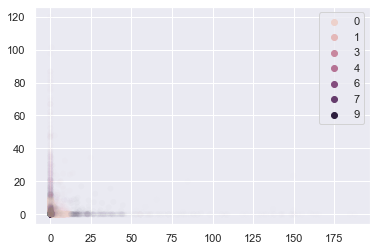

In [69]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10, random_state=42).fit(W)
sns.scatterplot(x=x, y=y, hue=kmeans.labels_, alpha=0.01)

Text(0.5, 1.0, 'Elbow curve')

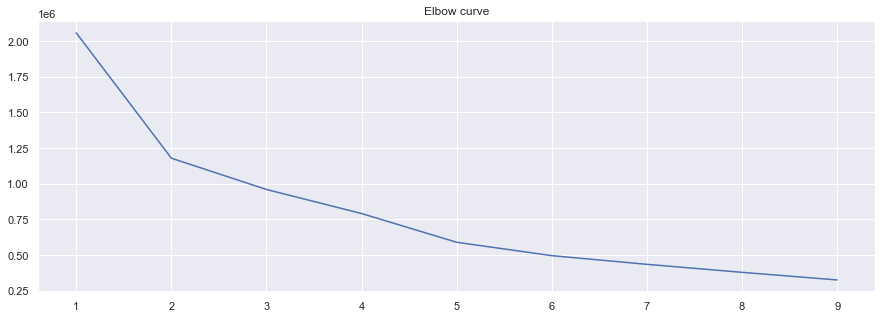

In [70]:

from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm

X = W
distorsions = []


for k in tqdm(range(1, 10)):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(1, 10), distorsions)
plt.grid(True)
plt.title('Elbow curve')